# **TP 1 : Estimators – Stochastic gradient descent**

In [ ]:
#Import of librairies
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, f1_score, recall_score, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

## **Question 1**

Generation of a set of observations on $\mathbb{R}^2$ using a gaussian distribution.

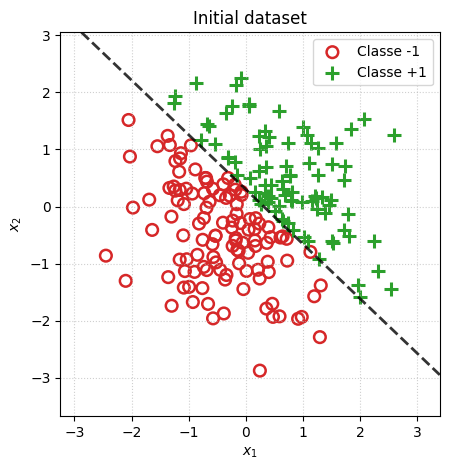

In [ ]:
seed = 100 #for reproducibility
n=200 #amount of points generated in total

#To draw random points in R^2, we use a gaussian distribution.
def generate_linear_dataset_with_bias(n, seed=seed, tau=None):
    """
    Generate {(x_i, y_i)}_{i=1..n} in R^2 with hyperplane <w*, x> + tau = 0.
    Use the augmented features \bar{x} = (x, 1) and \bar{w} = (w*, tau).

    Args
    ----
    n    : number of samples
    seed : RNG seed for reproducibility
    tau  : bias (float). If None, a random bias is drawn.

    Returns
    -------
    X       : array (n, 2) points in R^2
    X_bar   : array (n, 3) augmented features (x, 1)
    y       : array (n,) labels in {-1, +1} with sign(0)=+1
    w_star  : array (2,) normal vector
    tau     : float, bias used
    w_bar   : array (3,) augmented weights (w_star, tau)
    """
    rng = np.random.default_rng(seed)
    X = rng.normal(size=(n, 2))

    # Random normalized vector
    w_star = rng.normal(size=2)
    w_star = w_star / np.linalg.norm(w_star)

    # Bias (tau)
    if tau is None:
        tau = rng.normal()  # tu peux mettre 0.0 si tu ne veux pas de décalage

    # Augmented features and weights
    ones = np.ones((n, 1))
    X_bar = np.hstack([X, ones])           # (x, 1)
    w_bar = np.array([w_star[0], w_star[1], tau])  # (w*, tau)

    # Scores and labels
    s = X_bar @ w_bar
    y = np.where(s >= 0.0, 1, -1).astype(int)

    return X, X_bar, y, w_star, tau, w_bar


x, x_bar, y, w_star, tau_star, _ = generate_linear_dataset_with_bias(n)


def plot_dataset_with_boundary(X, y, w, tau, title="Initial dataset"):
    fig, ax = plt.subplots(figsize=(5.2, 4.8))

    # Points
    X_neg = X[y == -1]
    X_pos = X[y == +1]
    ax.scatter(X_neg[:, 0], X_neg[:, 1], marker='o', facecolors='none',
               edgecolors='tab:red', s=70, linewidths=1.8, label='Classe -1')
    ax.scatter(X_pos[:, 0], X_pos[:, 1], marker='+',
               color='tab:green', s=90, linewidths=2.2, label='Classe +1')

    # Display limit with pad
    pad = 0.8
    xmin, xmax = X[:, 0].min()-pad, X[:, 0].max()+pad
    ymin, ymax = X[:, 1].min()-pad, X[:, 1].max()+pad
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    # Boundary: <w, x> + tau = 0 -> y = -(w1/w2)x - tau/w2
    if abs(w[1]) > 0:  #
        xs = np.array([xmin, xmax])
        ys = -(w[0] / w[1]) * xs - (tau / w[1])
        ax.plot(xs, ys, linestyle='--', linewidth=2, color='black', alpha=0.8)
    else:  # vertical line: x = -tau / w1
        x0 = -tau / w[0]
        ax.plot([x0, x0], [ymin, ymax], linestyle='--', linewidth=2, color='black', alpha=0.8)

    ax.set_xlabel(r"$x_1$")
    ax.set_ylabel(r"$x_2$")
    ax.set_title(title)
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.set_aspect('equal', adjustable='box')
    ax.legend(loc='best')
    plt.tight_layout()
    plt.show()

plot_dataset_with_boundary(x, y, w_star, tau_star)

## **Question 2**

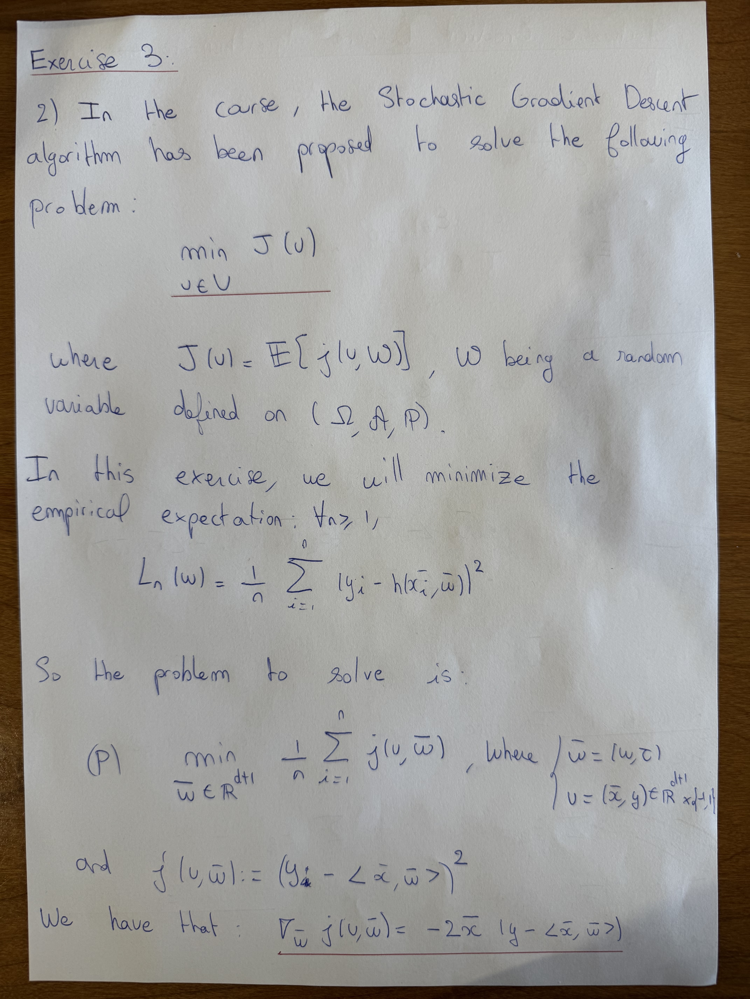

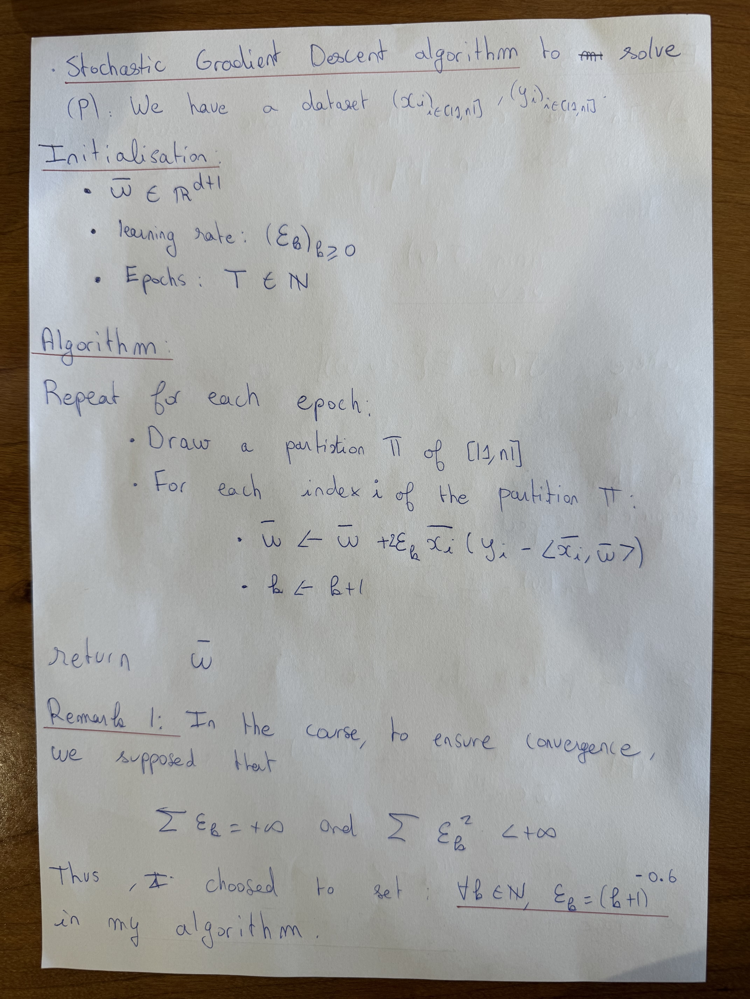

## **Question 3**

In [ ]:
def j(w_bar, u):
  '''
  Evaluate the function j at (w_bar,u).
  '''
  x_bar, y = u                 # x_bar: (d+1,), y: scalar
  r = y - x_bar @ w_bar
  return r * r

def grad_j(w_bar, u):
  '''
  Compute the gradient of the function j at (w_bar, u).
  '''
  x_bar, y = u
  r = y - x_bar @ w_bar
  return -2.0 * r * x_bar

def lr(t, lr0):
  '''
  Compute the learning rate at global step t.
  '''
  return lr0 / (max(1, t+1))**(0.6) #verifies the hypothesis of the course (Robbins–Monro)

In [ ]:
def adaline_sgd(X_bar, y, epochs, lr0=0.1, seed=0, w0=None, shuffle=True):
    """
    Minimize Ln(w) = (1/n) Σ (y_i - w^T x̄_i)^2 by SGD.
    Gradient of sample i : g_i = 2 (w^T x̄_i - y_i) x̄_i
    Args:
      X_bar   : (n, d+1) augmented features
      y       : (n,) labels in {-1, +1}
      epochs  : number of epochs
      lr0     : initial step size
      schedule: 'const' or '1/sqrt(t)' (t = global step counter)
      w0      : init (d+1,)
    Returns:
      w_bar : learned weights (d+1,)
      hist  : dict (loss_per_epoch, steps, lrs)
    """
    rng = np.random.default_rng(seed)
    n, d1 = X_bar.shape
    w = np.zeros(d1) if w0 is None else w0.astype(float).copy()

    # print(f"w.shape: {w.shape}")

    loss_hist, lrs = [], []
    t = 1
    for ep in range(epochs):
        idx = np.arange(n)
        if shuffle:
            rng.shuffle(idx)

        for i in idx:
            xi = X_bar[i]
            yi = y[i]
            yhat = float(xi @ w)
            g = 2.0 * (yhat - yi) * xi
            eta = lr(t, lr0)
            w -= eta * g
            # w -= 0.01*g #cste learning rate
            lrs.append(eta)
            t += 1

        # empirical loss at the end of the epoch
        yhat_all = X_bar @ w
        mse = np.mean((y - yhat_all) ** 2)
        loss_hist.append(mse)

    hist = {"loss_per_epoch": np.array(loss_hist), "steps": t - 1, "lrs": np.array(lrs)}
    return w, hist

In [ ]:
def plot_training_curve(loss_per_epoch):
    plt.figure(figsize=(5.2, 3.8))
    plt.plot(np.arange(1, len(loss_per_epoch)+1), loss_per_epoch, marker='o')
    plt.xlabel("Epoch"); plt.ylabel("MSE")
    plt.title("Adaline (SGD) – Perte empirique")
    plt.grid(True, linestyle=':')
    plt.tight_layout(); plt.show()

**Let's test it on our data points.**

In [ ]:
print(f"The theoretical w_star is {w_star} and tau is {tau_star}.")


The theoretical w_star is [0.69102581 0.72283008] and tau is -0.21627248762675705.


Stochastic gradient descent launched .....

The approximated w_bar is [ 0.63083518  0.54661219 -0.13909048]

The theoretical w_star is [ 0.69102581  0.72283008 -0.21627249]


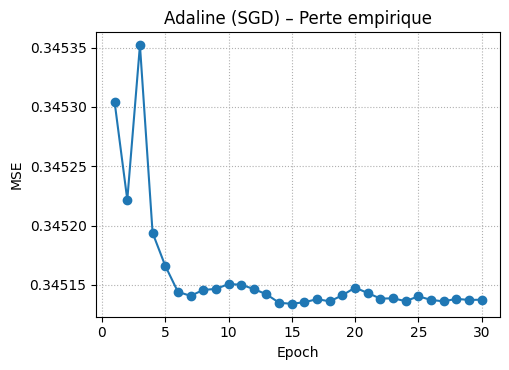

In [ ]:
epochs=30
epsilon_0 = 0.1
print(f"Stochastic gradient descent launched .....\n")
w_bar_0 = np.array([0.0, 0.0, 0.0], dtype=np.float64)
w_new, hist_initial = adaline_sgd(np.hstack([x, np.ones(shape=(x.shape[0],1))]), y, epochs, seed=seed, w0=w_bar_0)
w_star_bar = np.hstack([w_star,tau_star])
print(f"The approximated w_bar is {w_new}\n")
print(f"The theoretical w_star is {w_star_bar}")

plot_training_curve(hist_initial["loss_per_epoch"])

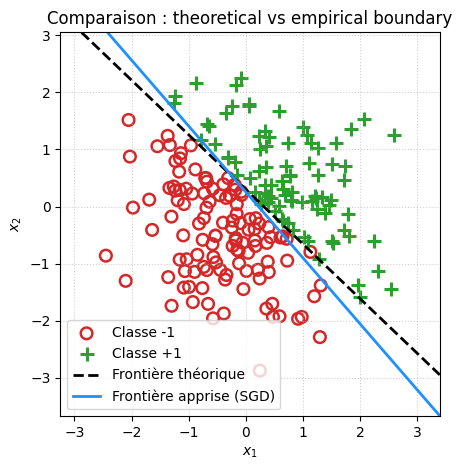

In [ ]:

def plot_comparison(X, y, w_bar_star, w_bar_sgd, title="Comparaison : theoretical vs empirical boundary"):
    """
    Compare the theoretical decision boundary and the one learned by adaline_SGD.

    Args:
      X : np.ndarray (n,2)
          Input points
      y : np.ndarray (n,)
          Labels in {-1, +1}
      w_bar_star : np.ndarray (3,)
          Theoretical vector (w*, tau*)
      w_bar_sgd : np.ndarray (3,)
          Vector learned by SGD
      title : str
          Plot title
    """
    fig, ax = plt.subplots(figsize=(5.6, 4.8))
    y = np.asarray(y).reshape(-1)
    # Red and green points
    X_neg = X[y == -1]
    X_pos = X[y == +1]
    ax.scatter(X_neg[:, 0], X_neg[:, 1], marker='o', facecolors='none',
               edgecolors='tab:red', s=70, linewidths=1.8, label='Classe -1')
    ax.scatter(X_pos[:, 0], X_pos[:, 1], marker='+',
               color='tab:green', s=90, linewidths=2.2, label='Classe +1')

    # Display limit
    pad = 0.8
    xmin, xmax = X[:, 0].min() - pad, X[:, 0].max() + pad
    ymin, ymax = X[:, 1].min() - pad, X[:, 1].max() + pad
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    # utilitary function to draw boundaries
    def plot_boundary(ax, w_bar, style, color, label):
        w = w_bar[:2]
        tau = w_bar[2]
        if abs(w[1]) > 1e-8:
            xs = np.array([xmin, xmax])
            ys = -(w[0]/w[1])*xs - (tau/w[1])
            ax.plot(xs, ys, style, lw=2, color=color, label=label)
        else:  # vertical line
            x0 = -tau / w[0]
            ax.plot([x0, x0], [ymin, ymax], style, lw=2, color=color, label=label)

    # Drawing the two boundaries
    plot_boundary(ax, w_bar_star, '--', 'black', 'Frontière théorique')
    plot_boundary(ax, w_bar_sgd, '-', 'dodgerblue', 'Frontière apprise (SGD)')


    ax.set_xlabel(r"$x_1$")
    ax.set_ylabel(r"$x_2$")
    ax.set_title(title)
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(loc='best')
    ax.set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.show()

plot_comparison(x, y, w_star_bar, w_new)

## **Question 4**

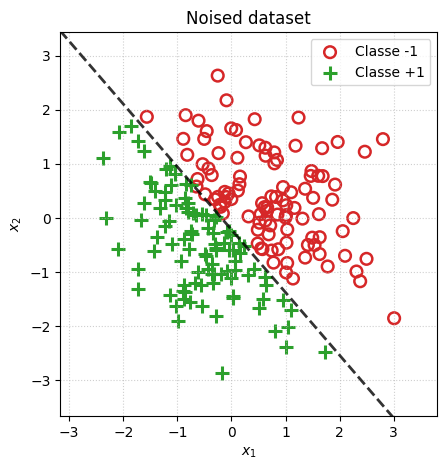

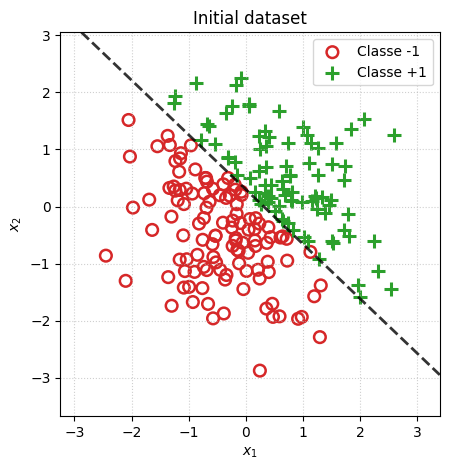

In [ ]:
def generate_noised_linear_dataset_with_bias(n, sigma, seed=seed, tau=None):
    """
    Generate {(x_i, y_i)}_{i=1..n} in R^2 with hyperplane <w*, x> + tau = 0.
    Use the augmented features \bar{x} = (x, 1) and \bar{w} = (w*, tau).

    Args:
      n    : number of samples
      sigma: standard deviation of the Gaussian noise
      seed : RNG seed for reproducibility
      tau  : bias (float). If None, a random bias is drawn.

    Returns:
      X       : array (n, 2) points in R^2
      X_bar   : array (n, 3) augmented features (x, 1)
      y       : array (n,) labels in {-1, +1} with sign(0)=+1
      w_star  : array (2,) normal vector
      tau     : float, bias used
      w_bar   : array (3,) augmented weights (w_star, tau)
    """
    rng = np.random.default_rng(seed)
    X = rng.normal(size=(n, 2)) + sigma*rng.normal(size=(n, 2))

    # Random normalized vector
    w_star = rng.normal(size=2)
    w_star = w_star / np.linalg.norm(w_star)

    # Bias (tau)
    if tau is None:
        tau = rng.normal()  # tu peux mettre 0.0 si tu ne veux pas de décalage

    # Augmented features and weights
    ones = np.ones((n, 1))
    X_bar = np.hstack([X, ones])           # (x, 1)
    w_bar = np.array([w_star[0], w_star[1], tau])  # (w*, tau)

    # Scores and labels
    s = X_bar @ w_bar
    y = np.where(s >= 0.0, 1, -1).astype(int)

    return X, X_bar, y, w_star, tau, w_bar

x_noised, x_bar_noised, y_noised, w_star_noised, tau_star_noised, w_bar_noised = generate_noised_linear_dataset_with_bias(n, sigma=0.3, seed=seed)

plot_dataset_with_boundary(x_noised, y_noised, w_star_noised, tau_star_noised, title="Noised dataset")
plot_dataset_with_boundary(x, y, w_star, tau_star)

In [ ]:
w_bar_0_noised = np.array([0.0, 0.0, 0.0], dtype=np.float64)
w_bar_noised, hist = adaline_sgd(np.hstack([x_noised, np.ones(shape=(x_noised.shape[0],1))]), y_noised, epochs, seed=seed, w0=w_bar_0_noised)

w_star_noised_tau = np.hstack([w_star_noised, tau_star_noised])

print(f"The approximated w_bar_noised is {w_bar_noised}.")
print(f"The theoretical w_star_noised is {w_star_noised_tau}.\n")

print(f"The approximated w_bar is {w_new}.")
print(f"The theoretical w_star is {w_star}.")

The approximated w_bar_noised is [-0.61733312 -0.53083691  0.00158959].
The theoretical w_star_noised is [-0.75774715 -0.65254828 -0.14020305].

The approximated w_bar is [ 0.63083518  0.54661219 -0.13909048].
The theoretical w_star is [0.69102581 0.72283008].


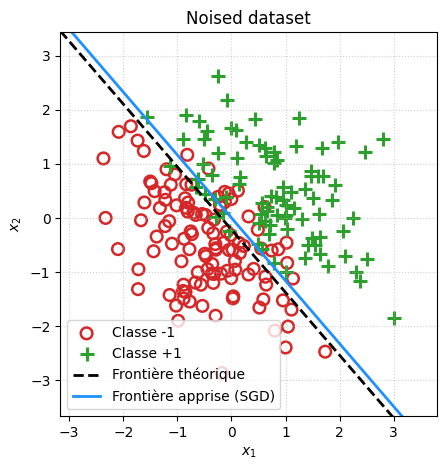

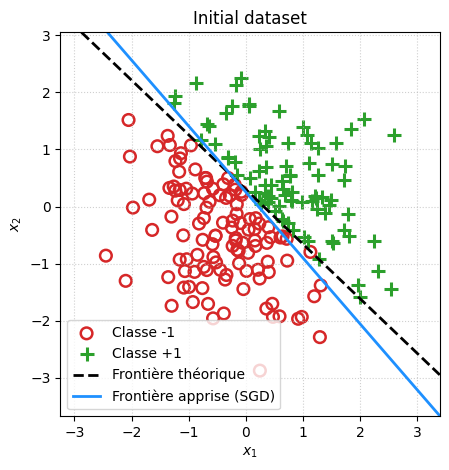

In [ ]:
plot_comparison(x_noised, y, w_star_noised_tau, w_bar_noised, title="Noised dataset")
plot_comparison(x, y, w_star_bar, w_new, title="Initial dataset")

We remark that the boundary seems more precise for the noised dataset than for the initial one.

We can also look at the training curves for each case.

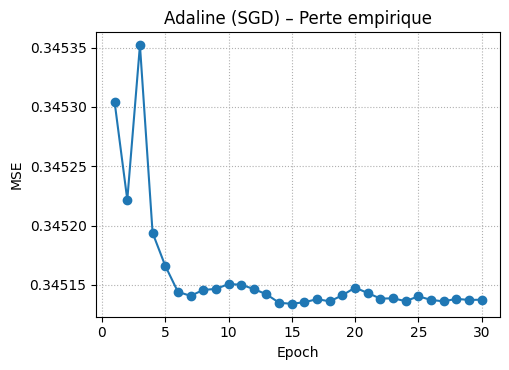

In [ ]:
#plot the training curve for initial SGD
plot_training_curve(hist_initial['loss_per_epoch'])

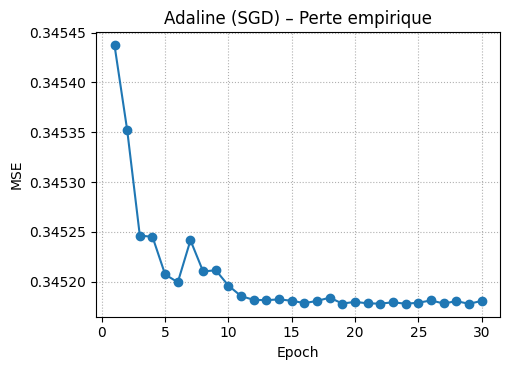

In [ ]:
#plot the training curve for noised SGD
plot_training_curve(hist['loss_per_epoch'])

We remark that the training curve of the initial dataset starts to stabilize around 6 epochs, but the noised one at 10 epochs.

## **Question 5**

In [ ]:
pip install ucimlrepo


In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
heart_disease = fetch_ucirepo(id=45)

# data (as pandas dataframes)
X = heart_disease.data.features
y = heart_disease.data.targets

# metadata
print(heart_disease.metadata)

# variable information
print(heart_disease.variables)


{'uci_id': 45, 'name': 'Heart Disease', 'repository_url': 'https://archive.ics.uci.edu/dataset/45/heart+disease', 'data_url': 'https://archive.ics.uci.edu/static/public/45/data.csv', 'abstract': '4 databases: Cleveland, Hungary, Switzerland, and the VA Long Beach', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 303, 'num_features': 13, 'feature_types': ['Categorical', 'Integer', 'Real'], 'demographics': ['Age', 'Sex'], 'target_col': ['num'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1989, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C52P4X', 'creators': ['Andras Janosi', 'William Steinbrunn', 'Matthias Pfisterer', 'Robert Detrano'], 'intro_paper': {'ID': 231, 'type': 'NATIVE', 'title': 'International application of a new probability algorithm for the diagnosis of coronary artery disease.', 'authors': 'R. Detrano, A. Jánosi, W. Steinbrunn, M

We have to treat the missing values in the features **ca** and **thal**.

In [ ]:
nan_ca=X['ca'].isna()
nan_thal=X['thal'].isna()
print(f"Amount of NaNs in feature \"ca\" : {np.sum(nan_ca)}.")
print(f"Amount of NaNs in feature \"thal\" : {np.sum(nan_thal)}.\n")

#We will get rid of the lines where we have missing values since it is a small amount.

X = X.dropna(axis=0)
y= y.loc[X.index]

nan_ca=X['ca'].isna()
nan_thal=X['thal'].isna()
print(f"Amount of NaNs in feature \"ca\" after processing : {np.sum(nan_ca)}.")
print(f"Amount of NaNs in feature \"thal\" after processing : {np.sum(nan_thal)}.")

Amount of NaNs in feature "ca" : 4.
Amount of NaNs in feature "thal" : 2.

Amount of NaNs in feature "ca" after processing : 0.
Amount of NaNs in feature "thal" after processing : 0.


In [ ]:
X.head(5)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0
1,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0
2,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0
3,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0
4,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0


In [ ]:
y.head(5)

,num
0,0
1,2
2,1
3,0
4,0


Since we want to know if a patient have a disease or not, we will transform y in the following way.

In [ ]:
y[y > 0] = 1
y[y == 0] = -1

A patient with a disease (y>0) will be set at 1, and patient with no diseases at -1.

In [ ]:
print(f"Shape of X : {X.shape}")
print(f"Shape of y : {y.shape}")

print(f"Types in y : {y.dtypes}")
print(f"Types in X \n: {X.dtypes}")

Shape of X : (297, 13)
Shape of y : (297, 1)
Types in y : num    int64
dtype: object
Types in X 
: age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca          float64
thal        float64
dtype: object


In [ ]:
#### PARAMETERS
epochs=50

X_bar = np.hstack([X, np.ones(shape = (X.shape[0],1))]) #we add the ones vector at the end
y = y.to_numpy() #we convert to numpy so that our function adaline_sgd works

/tmp/ipython-input-68417923.py:33: RuntimeWarning: overflow encountered in multiply
  g = 2.0 * (yhat - yi) * xi
/tmp/ipython-input-68417923.py:33: RuntimeWarning: invalid value encountered in multiply
  g = 2.0 * (yhat - yi) * xi
/tmp/ipython-input-68417923.py:32: RuntimeWarning: invalid value encountered in matmul
  yhat = float(xi @ w)


Experimental w found with Adaline_SGD : [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]


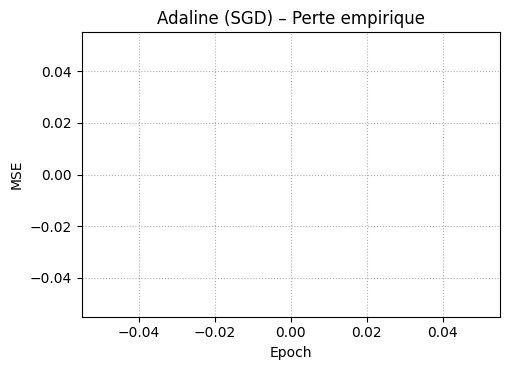

In [ ]:
# w_bar_0=np.random.uniform(low=-10, high=10, size=X.shape[1] + 1)
w_bar, hist = adaline_sgd(X_bar, y, epochs, seed=seed)  #Initialize w_bar_0 to the null vector

print(f"Experimental w found with Adaline_SGD : {w_bar}")

plot_training_curve(hist["loss_per_epoch"])



**We have bad results, let's try to scale our data to fix it.**




In [ ]:
X_train_df, X_test_df, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=seed, stratify=y)


scaler = StandardScaler()
X_train = scaler.fit_transform(X_train_df.to_numpy())   # (n_train, d)
X_test  = scaler.transform(X_test_df.to_numpy())

X_train_bar = np.hstack([X_train, np.ones(shape = (X_train.shape[0],1))])
X_test_bar = np.hstack([X_test, np.ones(shape = (X_test.shape[0],1))])

Experimental w found with Adaline_SGD : [-0.02907454  0.1867572   0.14332677  0.09172513  0.01036418 -0.09874739
  0.06282021 -0.15851038  0.15143372  0.09161939  0.02985483  0.25390229
  0.23911525 -0.08074236]


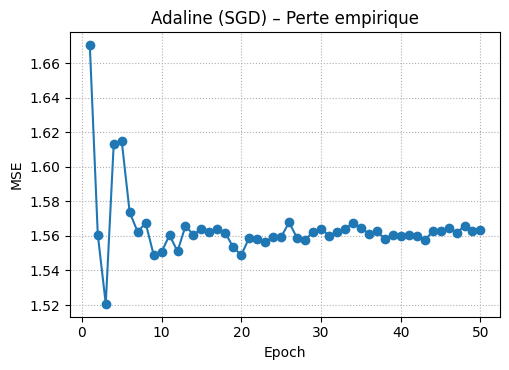

In [ ]:
w_bar, hist = adaline_sgd(X_train_bar, y_train, epochs=epochs, seed=seed)  #Initialize w_bar_0 to the null vector

print(f"Experimental w found with Adaline_SGD : {w_bar}")

plot_training_curve(hist["loss_per_epoch"])


We have solved the issue ! **It is important to scale our data so that the SGD converges.**

### **Testing our results.**

In [ ]:
y_hat_test = X_test_bar@w_bar


y_hat_test[ y_hat_test >= 0] = 1
y_hat_test[ y_hat_test < 0] = -1


rmse = np.sqrt(np.mean((y_hat_test - y_test)**2))
mae = np.mean(np.abs((y_hat_test - y_test)))

print(f"RMSE={rmse:.4f}   MAE={mae:.4f}")


acc = accuracy_score(y_test, y_hat_test)
f1m = f1_score(y_test, y_hat_test)
rec = recall_score(y_test, y_hat_test)
print(f"Accuracy={acc:.4f}  F1={f1m:.4f} Recall:{rec:.4f}")

RMSE=1.4048   MAE=0.9867
Accuracy=0.8267  F1=0.8000 Recall:0.7429


The model performs well, with high accuracy and recall. Let’s train a more advanced model, such as a Random Forest, and compare the results.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 15],
    'min_samples_leaf': [1, 3, 5],
    'criterion': ['gini', 'entropy']
}

rf_clf = RandomForestClassifier(random_state=42)


print("Début de l'optimisation (Grid Search) pour la Random Forest...")
grid_search_rf = GridSearchCV(estimator=rf_clf,
                            param_grid=param_grid_rf,
                            cv=5,
                            scoring='accuracy',
                            n_jobs=-1,
                            verbose=1)

grid_search_rf.fit(X_train_bar, y_train)

Début de l'optimisation (Grid Search) pour la Random Forest...
Fitting 5 folds for each of 54 candidates, totalling 270 fits


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 15],
                         'min_samples_leaf': [1, 3, 5],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy', verbose=1)

In [ ]:
predictions_rf = grid_search_rf.predict(X_test_bar)

acc_rf = accuracy_score(y_test, predictions_rf)
f1m_rf = f1_score(y_test, predictions_rf)
rec_rf = recall_score(y_test, predictions_rf)

print(f"Accuracy={acc_rf:.4f}  F1={f1m_rf:.4f} Recall:{rec_rf:.4f}")

Accuracy=0.7867  F1=0.7419 Recall:0.6571


### **Conclusion**



With Stochastic Gradient Descent, we achieved much better performance than with a Random Forest classifier.